# Manifold

author: steeve.laquitaine@epfl.ch  
date: 21.02.1984

* task parameters (see bbp_workflow config):
    * start delay: 1000 ms
    * stimulus delay: 1500 ms
    * 360 stimuli x 50 repeated trials for characterizing the tuning curves
    * interstimulus interval: 200 ms


* data:
    1. 36 simulation files
    2. bbp_workflow config script spikesorting_stim_rotations.py indicates 36 files with orientations for file 1: 0 to 9, file 2: 10 to 19 etc...
    3. png files confirm point 2): /gpfs/bbp.cscs.ch/project/proj83/scratch/home/isbister/post_physiology_2023/sim_data/campaigns/spikesorting_stimulus_tests/4_spikesorting_stimulus_test_neuropixels_8-1-24/4_spikesorting_stimulus_test_neuropixels_8-1-24__8slc_80f_360r_50t_200ms_1_smallest_fiber_gids/0fcb7709-b1e9-4d84-b056-5801f20d55af/35
    5. Thus: Each simulation file is organized as: simulation file duration (101500 ms) = start delay of 1500 ms then 10 repeats of (orientation for 9800 ms followed by 200 ms of ISI)

## Requirements

* activate manifold_metrics kernel

In [12]:
# SETUP PACKAGES 
%load_ext autoreload
%autoreload 2
import os
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec
import spikeinterface as si
import numpy as np
from collections import Counter
import pandas as pd
from sklearn.decomposition import PCA # dimensionality reduction
from mftma.manifold_analysis_correlation import manifold_analysis_corr

# SET PROJECT PATH
PROJ_PATH = "/gpfs/bbp.cscs.ch/project/proj85/home/laquitai/preprint_2023"
os.chdir(PROJ_PATH)
from src.nodes.utils import get_config


# EVOKED
EXPERIMENT = "silico_neuropixels"
SIMULATION_DATE = "stimulus"
data_conf, _ = get_config(EXPERIMENT, SIMULATION_DATE).values()
GT_SORTING_PATH = data_conf["sorting"]["simulation"]["ground_truth"]["output"]
RECORDING_PATH = data_conf["probe_wiring"]["output"]

# SORTINGS

# kilosort 3.0
KS3_SORTING_PATH = data_conf["sorting"]["sorters"]["kilosort3"]["output"]

# kilosort 2.5
KS2_5_SORTING_PATH = data_conf["sorting"]["sorters"]["kilosort2_5"]["output"]

# kilosort 2.0
KS2_SORTING_PATH = data_conf["sorting"]["sorters"]["kilosort2"]["output"]

# kilosort
KS_SORTING_PATH = data_conf["sorting"]["sorters"]["kilosort"]["output"]

# hdsort (TODO: fix bug gaussmf)
#KS_SORTING_PATH = data_conf["sorting"]["sorters"]["kilosort"]["output"]

# herdingspikes
hdsp_SORTING_PATH = data_conf["sorting"]["sorters"]["herdingspikes"]["output"]

# klusta (TODO: fix bug)

# TASK DESIGN PARAMETERS
N_SIMS = 36 # number of simulation files


# FIGURE SETTINGS
COLOR_VIVO = (0.7, 0.7, 0.7)
COLOR_SILI = (0.84, 0.27, 0.2)
COLOR_STIM = (0.6, 0.75, 0.1)
BOX_ASPECT = 1                  # square fig
FIG_SIZE = (1,1)
plt.rcParams['figure.figsize'] = (2,1)
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 6
plt.rcParams['lines.linewidth'] = 0.2
plt.rcParams['axes.linewidth'] = 0.5
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['xtick.major.width'] = 0.3
plt.rcParams['xtick.minor.size'] = 0.1
plt.rcParams['xtick.major.size'] = 1.5
plt.rcParams['ytick.major.size'] = 1.5
plt.rcParams['ytick.major.width'] = 0.3
legend_cfg = {"frameon": False, "handletextpad": 0.1}
savefig_cfg = {"transparent":True}

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
2024-02-22 15:41:25,222 - root - utils.py - get_config - INFO - Reading experiment config.
2024-02-22 15:41:25,339 - root - utils.py - get_config - INFO - Reading experiment config. - done


### Custom functions

In [4]:
def get_task_parameters(
    start_delay=500,
    n_orientations=10,
    n_repeats=50,
    stimulus_duration=200,
    n_simulations=36,
):
    # get epoch timings
    epoch_ms = n_simulations * (
        [start_delay] + n_orientations * n_repeats * [stimulus_duration]
    )
    # get epoch labels
    epoch_labels = n_simulations * (
        ["delay"] + n_orientations * n_repeats * ["stimulus"]
    )

    return {"epoch_labels": epoch_labels, "epoch_ms": epoch_ms}


def get_stimulus_intervals_ms(epoch_labels, epoch_ms):

    # find stimulus epoch starts and ends
    epoch_end_ms = np.cumsum(epoch_ms)
    epoch_start_ms = np.hstack([0, epoch_end_ms])[:-1]
    df = pd.DataFrame(data=epoch_end_ms)
    df.columns = ["end"]
    df.insert(0, "start", epoch_start_ms)
    df.index = epoch_labels

    # get stimulus intervals
    return [tuple(df.iloc[ix]) for ix in range(len(df)) if df.index[ix] == "stimulus"]


def get_stimulus_labels():
    start = np.arange(0, 360, 10)
    end = np.arange(10, 370, 10)

    stimulus_labels = []
    for ix in range(36):
        stimulus_labels.append(np.repeat(np.arange(start[ix], end[ix], 1), 50))
    return np.array(stimulus_labels).flatten()


def convert_spike_trains_to_ms(spike_trains: np.array, sfreq: int):
    """_summary_

    Args:
        spike_trains (np.array): _description_
        sfreq (int): _description_

    Returns:
        _type_: _description_
    """
    sample_ms = 1 / (sfreq / 1000)
    spike_trains_ms = spike_trains * sample_ms
    return spike_trains_ms


def get_evoked_responses(spike_trains_ms: np.array, stim_intervals_ms: np.array):
    """_summary_

    Args:
        spike_trains_ms (np.array): _description_
        stim_intervals_ms (np.array): array of tuples (start, end)

    Returns:
        _type_: _description_
    """
    # Use numpy's digitize function to find the bin indices for each value
    bins = [interval[1] for interval in stim_intervals_ms]

    # Return the indices of the bins to which each value in spike_trains_ms belongs.
    bin_indices = np.digitize(spike_trains_ms, bins=bins)

    # Use Counter to count occurrences of bin indices
    interval_counter = Counter(bin_indices)

    # find active stimulus epochs
    active_bin_spike_count = [items[1] for items in list(interval_counter.items())]
    active_bin_ix = [items[0] for items in list(interval_counter.items())]

    # cast unit responses by stimulus epoch in an array
    unit_responses = np.zeros(len(bins))
    unit_responses[active_bin_ix] = active_bin_spike_count
    return unit_responses


def compute_response_by_stim_matrix(unit_ids, SortingTrueKS3, stimulus_intervals_ms):
    """_summary_

    Args:
        SortingTrueKS3 (_type_): _description_
        stimulus_intervals_ms (_type_): _description_

    Returns:
        _type_: _description_
    """
    SFREQ = SortingTrueKS3.get_sampling_frequency()

    # takes 18 secs
    responses = []
    for unit_id in unit_ids:
        spike_trains = SortingTrueKS3.get_unit_spike_train(unit_id)
        spike_trains_ms = convert_spike_trains_to_ms(spike_trains, SFREQ)
        responses.append(get_evoked_responses(spike_trains_ms, stimulus_intervals_ms))
    return np.array(responses)


def plot_manifold_from_pca(responses: np.ndarray, params: dict, fig):
    """
    Args:
      responses (np.ndarray): neurons x stimulus
    """
    # fit pca to neural responses
    pca = PCA(n_components=params["dims"])  # parametrize pca
    manifold = pca.fit_transform(responses.T)  # apply pca
    manifold = manifold / np.max(np.abs(manifold))  # normalise the values

    # setup plot parameters
    FIG_SIZE = (4, 4)
    AXIS_LIM = np.max(manifold)
    DOWNSAMPLE = 10

    # setup plot

    plt.set_cmap("hsv")  # circular cmap

    # 3D projection
    ax = fig.add_subplot(2, 1, 1, projection="3d")
    ax.view_init(20, 45, 0)  # elevation, azimuth, roll

    # color the stimulus orientations
    cmap = params["orientations"][::DOWNSAMPLE]

    # plot neural manifold
    scat = ax.scatter(
        manifold[::DOWNSAMPLE, 0],
        manifold[::DOWNSAMPLE, 1],
        manifold[::DOWNSAMPLE, 2],
        c=cmap,
    )
    # ax.set_xlim([-AXIS_LIM, AXIS_LIM])
    # ax.set_ylim([-AXIS_LIM, AXIS_LIM])
    ax.set_xlim([-0.5, AXIS_LIM])
    ax.set_ylim([-0.5, AXIS_LIM])
    # ax.set_zlim([-AXIS_LIM, AXIS_LIM])
    ax.set_zlim([-0.5, 0.5])
    cbar = plt.colorbar(scat, fraction=0.026, pad=0.04)
    cbar.ax.set_ylabel("Stimulus orientations (deg)", rotation=270)

    # legend
    ax.set_xlabel("Neural latent 1")
    ax.set_ylabel("Neural latent 2")
    ax.set_zlabel("Neural latent 3")
    ax.spines[["top", "right"]].set_visible(False)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.set_box_aspect((1, 1, 1))
    return {"manifold": manifold, "axis_lim": AXIS_LIM, "fig": fig, "ax": ax}


def plot_manifold_dims_1_2(manifold: dict, params, fig):

    DOWNSAMPLE = 10
    AXIS_LIM = np.max(manifold["manifold"])

    # add panel
    ax = fig.add_subplot(2, 1, 2)

    # color the stimulus orientations
    cmap = params["orientations"][::DOWNSAMPLE]

    # plot neural manifold
    scat = ax.scatter(
        manifold["manifold"][::DOWNSAMPLE, 0],
        manifold["manifold"][::DOWNSAMPLE, 1],
        c=cmap,
    )
    # ax.set_xlim([-AXIS_LIM, AXIS_LIM])
    # ax.set_ylim([-AXIS_LIM, AXIS_LIM])
    ax.set_xlim([-0.5, AXIS_LIM])
    ax.set_ylim([-0.5, AXIS_LIM])

    cbar = plt.colorbar(scat, fraction=0.026, pad=0.04)
    cbar.ax.set_ylabel("Stimulus orientations (deg)", rotation=270)

    # legend
    ax.set_xlabel("Neural latent 1")
    ax.set_ylabel("Neural latent 2")
    ax.spines[["top", "right"]].set_visible(False)
    ax.set_box_aspect((1))
    return fig, ax


def reshape_responses(responses: np.array, stimulus_labels, n_exple_per_class: int):
    """format unit responses into a list of N_CLASSES arrays of
    size N units x N_EXPLE_PER_CLASS

    Returns:
        (list[arrays]): _description_
    - e.g., dataset = [np.random.randn(5000, 50) for i in range(100)]
    """
    dataset = [
        responses[:, stimulus_labels == orientation]
        for orientation in np.unique(stimulus_labels)
    ]
    assert dataset[1].shape[1] == n_exple_per_class, "wrong shape"
    return dataset

### Load datasets

In [5]:
# get true evoked ata
SortingTrue = si.load_extractor(GT_SORTING_PATH)
Recording = si.load_extractor(RECORDING_PATH)
duration_secs = Recording.get_total_duration()
SFREQ = SortingTrue.get_sampling_frequency()
print(SortingTrue.unit_ids)

# get sorted evoked data
SortingKS3 = si.load_extractor(KS3_SORTING_PATH)
print(SortingKS3.unit_ids)

[  12165   15894   16652 ... 4228700 4229218 4229506]
[   0    1    2 ... 2620 2621 2622]


### Sanity check task params

In [6]:
# sanity check durations and task design

# recording duration
print("recording duration (secs):", duration_secs)

# reconstructed duration from task parameters
# each file contains one stimulus orientation
# 1 - (each simulation file duration (ms) - first 1000 ms that was dropped) * 36 orientation stim / 1000 ms
reconstructed_duration = (101500 - 1000) * 36 / 1000
print("recording duration (secs):", reconstructed_duration)

# Each raw simulation file is organized as: simulation file duration (101500) = start delay of 1500 ms - 10 orientations (0 repeated 50 times for 200 ms without resting period
# then 1 repeated 50 times and so on )
# - file 1: orientation 0 to 9
# - file 2: orientation 10 to 19 etc..
raw_sim_ms = 1500 + 10 * 50 * 200
print("Raw simulation file duration (ms):", raw_sim_ms)

# Each raw simulation file is organized as: simulation file duration (101500) = start delay of 500 ms - 10 orientations (0 repeated 50 times for 200 ms without resting period
# then 1 repeated 50 times and so on )
# - file 1: orientation 0 to 9
# - file 2: orientation 10 to 19 etc..
curated_sim_ms = 500 + 10 * 50 * 200
print("Curated simulation file duration (ms):", curated_sim_ms)

recording duration (secs): 3617.9982
recording duration (secs): 3618.0
Raw simulation file duration (ms): 101500
Curated simulation file duration (ms): 100500


### Get task params

In [7]:
# get task epoch infos
task = get_task_parameters(
    start_delay=500,
    n_orientations=10,
    n_repeats=50,
    stimulus_duration=200,
    n_simulations=36,
)

# get stimulus labeles
stimulus_labels = get_stimulus_labels()

# get stimulus orientation labels
stimulus_intervals_ms = get_stimulus_intervals_ms(
    task["epoch_labels"], task["epoch_ms"]
)

print("orientations:", stimulus_intervals_ms)

orientations: [(500, 700), (700, 900), (900, 1100), (1100, 1300), (1300, 1500), (1500, 1700), (1700, 1900), (1900, 2100), (2100, 2300), (2300, 2500), (2500, 2700), (2700, 2900), (2900, 3100), (3100, 3300), (3300, 3500), (3500, 3700), (3700, 3900), (3900, 4100), (4100, 4300), (4300, 4500), (4500, 4700), (4700, 4900), (4900, 5100), (5100, 5300), (5300, 5500), (5500, 5700), (5700, 5900), (5900, 6100), (6100, 6300), (6300, 6500), (6500, 6700), (6700, 6900), (6900, 7100), (7100, 7300), (7300, 7500), (7500, 7700), (7700, 7900), (7900, 8100), (8100, 8300), (8300, 8500), (8500, 8700), (8700, 8900), (8900, 9100), (9100, 9300), (9300, 9500), (9500, 9700), (9700, 9900), (9900, 10100), (10100, 10300), (10300, 10500), (10500, 10700), (10700, 10900), (10900, 11100), (11100, 11300), (11300, 11500), (11500, 11700), (11700, 11900), (11900, 12100), (12100, 12300), (12300, 12500), (12500, 12700), (12700, 12900), (12900, 13100), (13100, 13300), (13300, 13500), (13500, 13700), (13700, 13900), (13900, 14100

### Compare manifolds

#### True evoked neural manifold

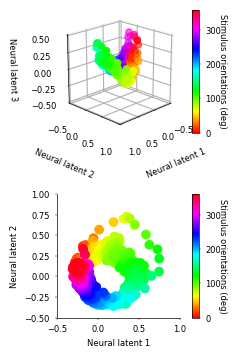

In [8]:
# takes 20 secs
FIG_SIZE = (4, 4)

# parameters
params = {"orientations": stimulus_labels}
params_pca = {
    "dims": 5,  # dimensions
    "orientations": params["orientations"],  # stimulus orientations
}

# compute matrix of unit x stimulus response matrix
responses = compute_response_by_stim_matrix(
    SortingTrue.unit_ids, SortingTrue, stimulus_intervals_ms
)

# plot
fig = plt.figure(figsize=FIG_SIZE)

# plot 3D manifold
manifold = plot_manifold_from_pca(responses, params_pca, fig)

# view dimension 1 and 2
fig, ax = plot_manifold_dims_1_2(manifold, params, fig)

fig.subplots_adjust(wspace=0.1, hspace=0.5)

# save figures
plt.savefig(
    "/gpfs/bbp.cscs.ch/project/proj85/home/laquitai/spikebias/figures/4_neural_code/svg/true_evoked_manifold.svg",
    **savefig_cfg,
)

#### All sorted evoked neural manifold

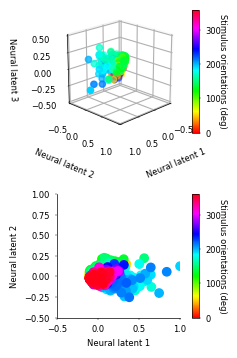

In [9]:
# takes 20 secs
# compute matrix of unit x stimulus response matrix
responses_all_sorted = compute_response_by_stim_matrix(
    SortingKS3.unit_ids, SortingKS3, stimulus_intervals_ms
)

# plot
fig = plt.figure(figsize=FIG_SIZE)

# plot 3D manifold
manifold_sorted = plot_manifold_from_pca(responses_all_sorted, params_pca, fig)

# view dimension 1 and 2
fig, ax = plot_manifold_dims_1_2(manifold_sorted, params, fig)

fig.subplots_adjust(wspace=0.1, hspace=0.5)

# save figures
plt.savefig(
    "/gpfs/bbp.cscs.ch/project/proj85/home/laquitai/spikebias/figures/4_neural_code/svg/all_sorted_evoked_manifold.svg",
    **savefig_cfg,
)

#### Sorted single units manifold

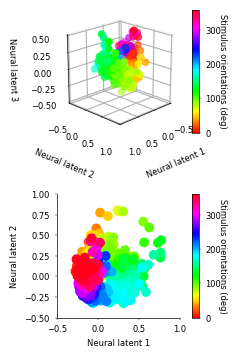

In [10]:
# takes 20 secs

single_unit_ids = SortingKS3.unit_ids[SortingKS3.get_property("KSLabel") == "good"]

# compute matrix of unit x stimulus response matrix
responses_sorted = compute_response_by_stim_matrix(
    single_unit_ids, SortingKS3, stimulus_intervals_ms
)

# plot
fig = plt.figure(figsize=FIG_SIZE)

# plot 3D manifold
manifold_sorted = plot_manifold_from_pca(responses_sorted, params_pca, fig)

# view dimension 1 and 2
fig, ax = plot_manifold_dims_1_2(manifold_sorted, params, fig)

fig.subplots_adjust(wspace=0.1, hspace=0.5)

# save figures
plt.savefig(
    "/gpfs/bbp.cscs.ch/project/proj85/home/laquitai/spikebias/figures/4_neural_code/svg/sorted_single_unit_evoked_manifold.svg",
    **savefig_cfg,
)

### Compare information contents

In [29]:
# format datasets
N_CLASSES = len(np.unique(params["orientations"]))  # number of classes (orientations)
N_EXPLE_PER_CLASS = sum(
    params["orientations"] == 0
)  # number of sample instances per class

In [32]:
# takes

np.random.seed(0)
kappa = 0
n_t = 200

# reshape responses
formatted_responses = reshape_responses(responses, stimulus_labels, N_EXPLE_PER_CLASS)

# analyse manifold geometry
capacity_all, radius_all, dimension_all, center_correlation, K = manifold_analysis_corr(
    formatted_responses, kappa, n_t
)

Optimizing...
Iteration    Cost                       Gradient norm     
---------    -----------------------    --------------    
   1         +1.5964524242053150e+04    1.02324315e+03    
   2         +1.3408263623537250e+04    3.72706188e+03    
   3         +1.2907813436055492e+04    1.46876167e+03    
   4         +1.2728588015928935e+04    8.41245323e+02    
   5         +1.2668841228184321e+04    6.53294288e+02    
   6         +1.2645458578734624e+04    5.27853292e+02    
   7         +1.2625186321734242e+04    4.39958959e+02    
   8         +1.2604825450794731e+04    4.30100546e+02    
   9         +1.2578737729722314e+04    4.99582633e+02    
  10         +1.2562171521554888e+04    2.90772359e+02    
  11         +1.2559247703747960e+04    2.44395074e+02    
  12         +1.2552441266119929e+04    1.50745418e+02    
  13         +1.2549203598525970e+04    2.66691923e+02    
  14         +1.2545732819836754e+04    1.45634526e+02    
  15         +1.2545035212914448e+04    1.

In [ ]:
# takes
np.random.seed(0)

# reshape responses
reshaped_responses = reshape_responses(
    responses_all_sorted, stimulus_labels, N_EXPLE_PER_CLASS
)

# analyse manifold geometry
(
    capacity_all_all_sorted,
    radius_all_all_sorted,
    dimension_all_all_sorted,
    center_correlation_all_sorted,
    K_all_sorted,
) = manifold_analysis_corr(reshaped_responses, kappa, n_t)

In [ ]:
# takes
np.random.seed(0)

# format responses for analysis
reshaped_responses = reshape_responses(
    responses_sorted, stimulus_labels, N_EXPLE_PER_CLASS
)

# analyse manifold geometry
(
    capacity_all_sorted,
    radius_all_sorted,
    dimension_all_sorted,
    center_correlation_sorted,
    K_sorted,
) = manifold_analysis_corr(reshaped_responses, kappa, n_t)